## Загрузка данных и изучение общей информации

Проект посвящен изучению рынка общественного питания Москвы и направлен на выявление факторов, влияющих на успешность заведения.
Результатом исследования будет 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')
display(df.head())
print(df.info())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


In [3]:
for i in df.columns:
    print(df[i].value_counts())

Кафе                         189
Шоколадница                  120
Домино'с Пицца                76
Додо Пицца                    74
One Price Coffee              71
                            ... 
Мандариновый гусь              1
Огоньки Cafe                   1
Птичка                         1
Nero Bean Coffee Roastery      1
Делимарше                      1
Name: name, Length: 5614, dtype: int64
кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64
Москва, проспект Вернадского, 86В                    28
Москва, Усачёва улица, 26                            26
Москва, площадь Киевского Вокзала, 2                 20
Москва, Ярцевская улица, 19                          20
Москва, Хорошёвское шоссе, 27                        16
                                                     ..
Москва, Малый Казённый переулок, 2       

Всего представлено 8406 заведений; столбцы name, category, address, district, hours, price, avg_bill хранят текстовую информацию, столбец chain хранит булевы (целочисленные) значения: 0,1. Остальные столбцы хранят вещественные числа. 

## Предобработка данных

Для дальнейшего обнаружения неявных дубликатов приведем некоторые текстовые данные к нижнему регистру:

In [4]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()
df['district'] = df['district'].str.lower()
df['avg_bill'] = df['avg_bill'].str.lower()
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
print(df.duplicated().sum())

0


Вывод:

Дубликатов не обнаружено

Посчитаем количество пропусков в данных:

In [6]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Выводы:

В некоторых столбцах пропусков очень много. Если заполнять их любым из средних значений (средним арифметическим/медианой), есть риски исказить данные. Такие показатели, как цены, количество посадочных мест и средний чек могут зависеть от параметров, которые мы не можем учесть за недостатком данных. При этом удалять все строки с пропусками тоже не кажется разумным, так как в некоторых случаях (например, middle_coffee_cup) они составляют большую часть значений. Таким образом, было решено оставить пропуски так, как есть. 

### Создайте столбец street с названиями улиц из столбца с адресом

In [7]:
def streets(value):
    return str(value).split(',')[1]
df['street'] = df['address'].map(streets)
display(df.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


### Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [8]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')
display(df.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


## Анализ данных

### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [9]:
category_count = df.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)
category_count.columns = ['category', 'count']
go.Figure(data=[go.Pie(labels=category_count['category'], values=category_count['count'])], 
          layout=go.Layout(title=go.layout.Title(text="Категории заведений")))

In [10]:
fig = px.bar(category_count, 
             x='category', 
             y='count', 
             text='count',
             title='Количество объектов по категориям')
fig.update_layout(xaxis_title='Категория заведения',
                  yaxis_title='Количество заведений такого типа', title_x=0.5)
fig.show() 

Вывод:

Наибольшую долю среди всех заведений составляют кафе (2378, 28.3%) и рестораны (2043). Меньше всего в данных булочных (256, 3.05%)

### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [11]:
aggfuncs = ['count', 'mean','median']
category_seats = df[df['seats'] != 0].groupby('category')['seats'].agg(aggfuncs).reset_index().sort_values(by='count', ascending=False).round(2)
fig = px.bar(category_seats, 
             x='category', 
             y='count', 
             text='count',
             title='Количество посадочных мест по категориям')
fig.update_layout(xaxis_title='Категория заведения',
                  yaxis_title='Количество посадочных мест', title_x=0.5)
fig.show() 

In [12]:
fig = px.bar(category_seats, 
             x='category', 
             y='median', 
             text='median',
             title='Медианное количество посадочных мест по категориям')
fig.update_layout(xaxis_title='Категория заведения',
                  yaxis_title='Медианное количество посадочных мест', title_x=0.5)
fig.show() 

Выводы: 

Абсолютное значение не представляет для нас наибольшей ценности, так как присутствует сильная разница в количестве заведений по категориям. По среднему количеству мест лидируют бары и пабы, в то время как по медианному количеству - рестораны. Важно отметить, что среднее значение может быть высоким за счет аномально больших значений. При этом по среднему количеству посадчных мест на втором месте находятся заведения категории "ресторан", в то время как по медианному вновь на втором месте оказываются бары. Таким образом, наибольшее количество посадочных мест в ресторанах, а также барах и пабах, наименьшее - в булочных (по всем показателям). 

### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [13]:
chain = df['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
fig = go.Figure(data=[go.Pie(labels=['Несетевые', 'Сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()
display(chain)

,chain,count
0,0,5201
1,1,3205


Выводы:

Несетевых (5201, 61.9%) заведений примерно в 1.5 раза больше, чем сетевых (3205, 38.1%)

### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [14]:
chain_objects = df.groupby(['category'])['chain'].agg(['sum','count']).reset_index()
chain_objects.columns = ['category', 'is_chained', 'count']
chain_objects = chain_objects.sort_values(['count'])
chain_objects['%_chain']=(chain_objects['is_chained']/chain_objects['count']*100).round(2)

In [15]:
fig = px.bar(chain_objects, 
             x='category', 
             y='is_chained', 
             text='%_chain',
             title='Доля сетевых заведений по категориям')
fig.update_layout(xaxis_title='Категория заведения',
                  yaxis_title='Доля сетевых объектов', title_x=0.5)
fig.show() 

Выводы:

В основном количество несетевых объектов по категориям превосходит число сетевых. Исключения составляют кофейни, где доля сетевых заведений составляет 50.96%. Также наблюдается больше сетевых пиццерий, чем несетевых (52.13%) и больше сетевых булочных (61.33%), но два последних результата, судя по графику, не могут быть достаточно репрезентативными, так как в выборке не очень много объектов данных категорий.

### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [16]:
top_chained = df[df['chain'] == 1].groupby('name').agg({'category' : pd.Series.mode, 'district' : 'count'})
top_chained = top_chained.rename(columns={'district':'count'})
top_chained = top_chained.sort_values('count', ascending = False).reset_index().head(15)
top_chained

,name,category,count
0,шоколадница,кофейня,120
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,50
7,хинкальная,кафе,44
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,39


In [17]:
top_chained['category'].value_counts()

кофейня     5
кафе        4
ресторан    3
пиццерия    2
булочная    1
Name: category, dtype: int64

In [18]:
fig = px.bar(top_chained,
             x='count',
             y='name', 
             text='count', 
             color='name'             
            )
fig.update_layout(title='ТОП-15 сетей с наибольшим количеством заведений в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведений',
                   showlegend=False)
fig.show() 

Выводы:

Наибольшую популярность имеет кофейня Шоколадница, далее следуют две пиццерии, на последнем месте располагается кафе Му-му. Большинство заведений в топе (5) являются кофейнями, меньше всего в датасете булочных (1).
Возможно, все заведения объединяются тем, что имеют большую популярность среди потребителей и средние цены. Также почти все заведения в этом топе доставляют еду на дом. 

### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [19]:
category_district = df.groupby(['district', 'category']).agg({'rating':'mean','rating':'median','name' : 'count'})
category_district = category_district.rename(columns={'name':'count'})
category_district = category_district.sort_values('rating', ascending = False).reset_index()
print('Общее количество заведений',len(df))
display(category_district)

Общее количество заведений 8406


,district,category,rating,count
0,центральный административный округ,"бар,паб",4.50,364
1,западный административный округ,"бар,паб",4.50,50
2,северо-западный административный округ,"бар,паб",4.40,23
3,центральный административный округ,ресторан,4.40,670
4,центральный административный округ,пиццерия,4.40,113
...,...,...,...,...
67,юго-восточный административный округ,кафе,4.20,282
68,северный административный округ,быстрое питание,4.15,58
69,западный административный округ,быстрое питание,4.10,62
70,юго-восточный административный округ,быстрое питание,4.10,67


In [20]:
fig = px.bar(category_district,
             x='count',
             y='district',                  
             color='category'
            )
fig.update_layout(title='Количество заведений категорий по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района'
                 )
fig.show() 

Выводы:

Во всех округах, кроме ЦАО, наибольшую долю составляют кафе. В то же время в ЦАО заведений намного больше, чем в любом другом округе, и в ЦАО наибольшее количество заведений причисляются к категории ресторанов. Во всех округах меньше всего булочных и столовых, при этом все категории имеют примерно одинаковую долю (от общего количества заведений) по всем округам. 

### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [21]:
category_rating = df.groupby('category')['rating'].agg(['mean','median']).round(2).sort_values('mean', ascending = False).reset_index()
category_rating

,category,mean,median
0,"бар,паб",4.39,4.4
1,пиццерия,4.30,4.3
2,ресторан,4.29,4.3
3,кофейня,4.28,4.3
4,булочная,4.27,4.3
5,столовая,4.21,4.3
6,кафе,4.12,4.2
7,быстрое питание,4.05,4.2


In [22]:
fig = px.bar(category_rating,
             x='mean',
             y='category',
             text = 'median',
             color='category'
            )
fig.update_layout(title='Усредненные рейтинги по категориям заведений',
                   xaxis_title='Усредненный рейтинг',
                   yaxis_title='Категория'
                 )
fig.update_xaxes(range=[4, 5])
fig.show() 

Выводы:

Все заведения имеют очень близкие по значениям усредненные рейтинги (в диапазоне от 4 до 4.4). Наибольший рейтинг имеют бары и пабы, наименьший рейтинг имеют заведения быстрого питания. У остальных заведений усредненный рейтинг примерно одинаковый. 

### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [23]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df['district'].unique()

array(['восточный административный округ',
       'западный административный округ',
       'северный административный округ',
       'северо-восточный административный округ',
       'северо-западный административный округ',
       'центральный административный округ',
       'юго-восточный административный округ',
       'юго-западный административный округ',
       'южный административный округ'], dtype=object)

In [24]:
pd.set_option('display.max_columns', 0)

In [25]:
import json

# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson2', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [26]:
# импортируем карту и хороплет
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap3.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m



В основном округа имеют одинаковый средний рейтинг по исследуемым заведениям (4,3). Выделяется Центральный административный округ с наибольшим рейтингом (4,4) и Северо-Восточный и Юго-Восточный административные округа, имеющие рейтинг, равный 4,2. 

### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [27]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [28]:
top_streets = df[df['street'].notnull()]['street'].value_counts().reset_index().head(15)
#top_streets = df[df['street'].notnull()].groupby('street')['сategory'].count().reset_index().head(15)
top_streets.columns = ['street_name', 'count']
top_streets

,street_name,count
0,проспект мира,184
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [29]:
streets_category = df.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street_name', 'category', 'count']
streets_category.sort_values('count', ascending=False)

,street_name,category,count
2137,проспект мира,кафе,53
1520,мкад,кафе,45
2140,проспект мира,ресторан,45
2138,проспект мира,кофейня,36
2149,профсоюзная улица,кафе,35
...,...,...,...
1535,молодёжная улица,"бар,паб",1
1536,молодёжная улица,кофейня,1
1538,монтажная улица,кофейня,1
1539,монтажная улица,ресторан,1


In [30]:
new_top_streets =streets_category[streets_category['street_name'].isin(top_streets['street_name'])]
new_top_streets

,street_name,category,count
698,варшавское шоссе,"бар,паб",6
699,варшавское шоссе,быстрое питание,7
700,варшавское шоссе,кафе,18
701,варшавское шоссе,кофейня,14
702,варшавское шоссе,пиццерия,4
...,...,...,...
3174,улица миклухо-маклая,быстрое питание,4
3175,улица миклухо-маклая,кафе,21
3176,улица миклухо-маклая,кофейня,4
3177,улица миклухо-маклая,пиццерия,2


In [31]:
fig = px.bar(new_top_streets,
             x='count', 
             y='street_name',                 
             color='category'
            )
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'},
                 )
fig.show() 

Проспект мира является наиболее популярным местом по числу заведений, из которых больше всего кафе, кофеен и ресторанов. Кофейни и рестораны составляют большую часть заведений практически на всех улицах. Меньше всего заведений питания находится на Пятницкой улице, среди них чаще всего встречаются бары, пабы и рестораны. 

### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [32]:
one_cafe = df.groupby('street').agg(count=('name', 'count')).sort_values(by='count', 
                                                         ascending=False).reset_index().query('count == 1')['street']

In [33]:
street_one = df.query('street in @one_cafe')

In [34]:
street_one = street_one.groupby('category').agg(count=('name', 
                            'count')).sort_values(by='count', ascending=False).reset_index()

In [35]:
fig = go.Figure(data=[go.Pie(labels=street_one['category'], values=street_one['count'])])
fig.update_layout(title='Соотношение заведений, которые могут быть единственными на улице', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.17, 
                                    y=1.05,
                                    text='Категория заведения',
                                    showarrow=False)])
fig.show()

Чаще всего на улицах, на которых расположено только одно заведение, находится кафе. Также много улиц, имеющих из заведений только один ресторан. Реже всего встречаются случаи, когда на улице расположена только одна булочная или пиццерия. 

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [36]:
price_ind = df.query('middle_avg_bill != 0').groupby('district').agg(median_middle_avg_bill=
                                    ('middle_avg_bill', 'median')).sort_values(by='median_middle_avg_bill',
                                         ascending=False).reset_index()

In [37]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=price_ind,
    columns=['district', 'median_middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

В основном средние чеки в разных районах примерно одинаковые - от 500 до 700 р. В Центральном и Западном административных округах в заведениях самые большие средние значения цены заказов (1000 р.). В заведениях питания в Юго-Восточном административном округе цены самые низкие - средний чек составляет 450 р.

### Вывод
- Всего представлено 8406 заведений. Наибольшую долю среди всех заведений составляют кафе (2378, 28.3%) и рестораны (2043). Меньше всего в данных булочных (256, 3.05%)
- Наибольшее количество посадочных мест в ресторанах, а также барах и пабах, наименьшее - в булочных (по всем показателям).
- Несетевых (5201, 61.9%) заведений примерно в 1.5 раза больше, чем сетевых (3205, 38.1%)
- - В основном количество несетевых объектов по категориям превосходит число сетевых. Исключения составляют кофейни, где доля сетевых заведений составляет 50.96%. Также наблюдается больше сетевых пиццерий, чем несетевых (52.13%) и больше сетевых булочных (61.33%).
- Наибольшую популярность имеет кофейня Шоколадница, далее следуют две пиццерии, на последнем месте располагается кафе Му-му. Большинство заведений в топе (5) являются кофейнями, меньше всего в датасете булочных (1). Возможно, все заведения объединяются тем, что имеют большую популярность среди потребителей и средние цены. Также почти все заведения в топе доставляют еду на дом.
- Во всех округах, кроме ЦАО, наибольшую долю составляют кафе. В то же время в ЦАО заведений намного больше, чем в любом другом округе, и в ЦАО наибольшее количество заведений причисляются к категории ресторанов. Во всех округах меньше всего булочных и столовых, при этом все категории имеют примерно одинаковую долю (от общего количества заведений) по всем округам.
- Все заведения имеют очень близкие по значениям усредненные рейтинги (в диапазоне от 4 до 4.4). Наибольший рейтинг имеют бары и пабы, наименьший рейтинг имеют заведения быстрого питания. У остальных заведений усредненный рейтинг примерно одинаковый.
- В основном округа имеют одинаковый средний рейтинг по исследуемым заведениям (4,3). Выделяется Центральный административный округ с наибольшим рейтингом (4,4) и Северо-Восточный и Юго-Восточный административные округа, имеющие рейтинг, равный 4,2.
- Проспект мира является наиболее популярным местом по числу заведений, из которых больше всего кафе, кофеен и ресторанов. Кофейни и рестораны составляют большую часть заведений практически на всех улицах. Меньше всего заведений питания находится на Пятницкой улице, среди них чаще всего встречаются бары, пабы и рестораны.
- Чаще всего на улицах, на которых расположено только одно заведение, находится кафе. Также много улиц, имеющих из заведений только один ресторан. Реже всего встречаются случаи, когда на улице расположена только одна булочная или пиццерия.
- В основном средние чеки в разных районах примерно одинаковые - от 500 до 700 р. В Центральном и Западном административных округах в заведениях самые большие средние значения цены заказов (1000 р.). В заведениях питания в Юго-Восточном административном округе цены самые низкие - средний чек составляет 450 р.

## Детализируем исследование: открытие кофейни

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [38]:
print('Количество кофеен в датасете', len(df.query('category == "кофейня"')))

Количество кофеен в датасете 1413


In [39]:
cafe = df.query('category == "кофейня"')

In [40]:
cafe_district = cafe.groupby('district').agg(count=('name',
                                'count')).sort_values(by='count',
                                ascending=False).reset_index()

In [41]:
fig = go.Figure(data=[go.Pie(labels=cafe_district['district'], values=cafe_district['count'])])
fig.update_layout(title='Количество кофеен по районам Москвы', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.15, 
                                    y=1.05,
                                    text='Район',
                                    showarrow=False)])
fig.show() 

In [42]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cafe_district,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

# выводим карту
m

Наибольшее число кофеен находится в ЦАО (428), в остальных округах заведений данной категории значительно меньше. Например, в Северном административном округе расположены от 184 до 245 кофеен, а в Северо-Восточном, Южном и Западном административных округах от 123 до 184. В остальных округах кофеен менее 123.

### Есть ли круглосуточные кофейни?

In [43]:
print(round(len(cafe.query('hours == "ежедневно, круглосуточно"')) / len(cafe),4))

0.0418


Круглосуточные кофейни есть, но их достаточно мало:количество круглосуточных кофеен составляет около 4% от общего числа кофеен.

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [44]:
dist_rating = cafe.groupby('district').agg(rating=('rating', 
                        'median')).sort_values(by='rating',
                        ascending=False).reset_index()

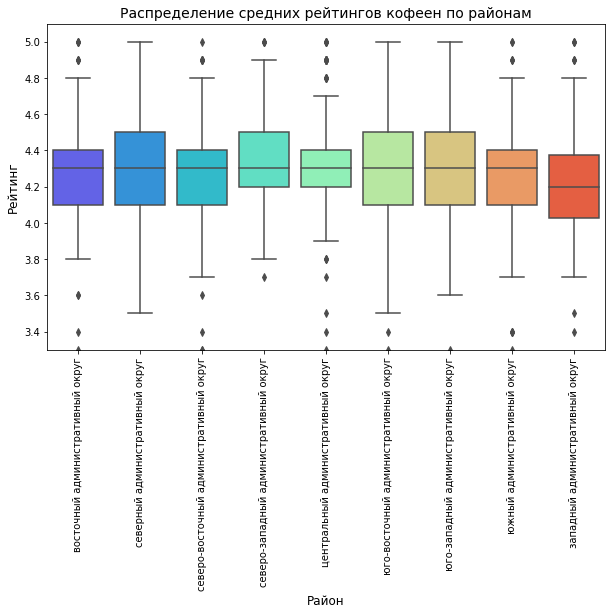

In [45]:
plt.figure(figsize=(10, 6))
# строим график boxplot средствами seaborn
sns.boxplot(x='district', 
            y='rating', 
            data=cafe, 
            order=dist_rating.district, 
            palette='rainbow')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средних рейтингов кофеен по районам', fontsize=14)
plt.xlabel('Район', fontsize=12)
plt.ylabel('Рейтинг', fontsize=12)
plt.ylim(3.3, 5.1)
# поворачиваем подписи значений по оси X на 90 градусов
plt.xticks(rotation=90)
# отображаем график на экране
plt.show()

В среднем у всех кофеен примерно одинаковый рейтинг (4,3). Наибольшая вариация рейтинга наблюдается для кофеен, которые расположены в Северном и Юго-Восточном административных округах, при этом кофейни, которые по своему рейтингу сильно отличаются от среднего значения, в основном расположены в Северо-Восточном, Восточном и Центральном административных округах (наибольшее количество выбросов). 

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [46]:
cup = cafe.query('middle_coffee_cup != 0').groupby('district').agg(median_middle_coffee_cup=
                                ('middle_coffee_cup', 'median')).sort_values(by='median_middle_coffee_cup', 
                                ascending=False).reset_index()

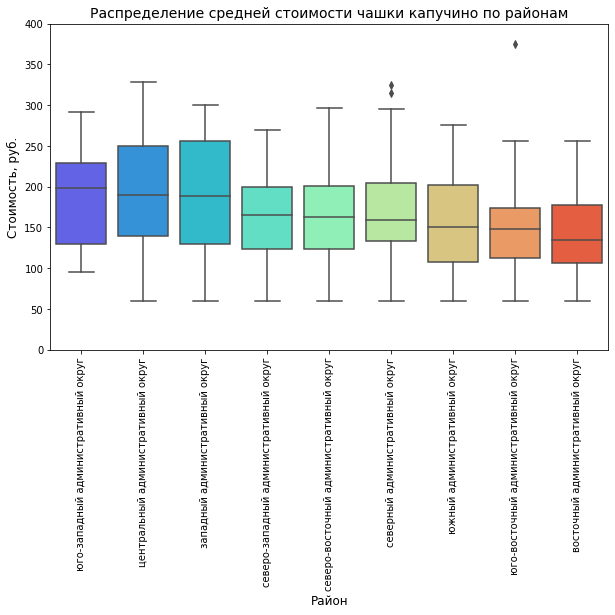

In [47]:
# назначаем размер графика
plt.figure(figsize=(10, 6))
# строим график boxplot средствами seaborn
sns.boxplot(x='district', 
            y='middle_coffee_cup', 
            data=cafe.query('middle_coffee_cup != 0'), 
            order=cup.district, 
            palette='rainbow')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средней стоимости чашки капучино по районам', fontsize=14)
plt.xlabel('Район', fontsize=12)
plt.ylabel('Стоимость, руб.', fontsize=12)
plt.ylim(0, 400)
# поворачиваем подписи значений по оси X на 90 градусов
plt.xticks(rotation=90)
# отображаем график на экране
plt.show()

Среднее значение цены чашки капучино различаются незначительно (от 150 до 200 р.). Разброс значений для разных округов примерно одинаковый. Значительные отличия в цене встречаются среди кофеен Северного административного округа и Юго-Восточного административного округа, но их мало. Самые высокие цены на капучино в кофейнях Юго-Западного округа, а самые низкие - в кофейнях Восточного округа.

### Рекомендации для открытия нового заведения

Рекомендуется открыть кофейни в Центральном административном округе и Северном округе. В ЦАО цены на чашку капучино являются одними из самых высоких (на втором месте среди всех округов), в САО цены ниже, при этом встречаются кофейни с аномально высокими ценами за чашку кофе. Если цены в новом заведении будут не очень высокими (ниже среднего значения по округам), кофейня будет пользоваться популярностью, и в итоге сможет окупиться. Это произойдет потому, что в ЦАО и САО расположено самое большое количество кофеен, что может указывать на высокую степень проходимости. Также в ЦАО очень много разных кофеен, на что указывают аномальные значения в рейтинге (как значительно выше, так и значительно ниже). То же самое свойственно САО, но в этом округе значения рейтинга при этом распределены равномерно. Разнообразие заведений соответсвующей категории указывает на то, что, какой бы ни была потенциальная кофейня, на нее скорее всего будет спрос. Также в САО количество кофеен примерно равно количеству ресторанов, в то время как в большинстве округов ресторанов значительно больше, чем кофеен, что может способствовать снижению конкуренции с другой категорией заведений для потенциальной кофейни. 

In [48]:
import folium

In [49]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cafe_district,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cafe.apply(create_clusters, axis=1)
#55.751244, 37.618423
new_coffee_shop_lat_1, new_coffee_shop_lng_1 = 55.7235404, 37.585314
new_coffee_shop_lat_2, new_coffee_shop_lng_2 = 55.798533, 37.5520322
    
# добавляем маркер на карту
folium.Marker([new_coffee_shop_lat_1, new_coffee_shop_lng_1],\
              popup='Новая кофейня')\
              .add_to(m)
folium.Marker([new_coffee_shop_lat_2, new_coffee_shop_lng_2],\
              popup='Новая кофейня')\
              .add_to(m)


m

Рекомендуемые локации для кофеен расположены следующим образом:
- В Центральном административном округе большинство кофеен сосредоточены на севере и юго-востоке, при этом в Юго-Западном округе кофеен очень мало (от 62 до 123), цены на кофе низкие. Поэтому предположительно можно разаместить новое заведение на юго-западе ЦАО, чтобы она располагалась ближе к тому областям, где заведений данной категории представлено мало. При этом можно заметить, что выбранная область является распространенной среди посетителей, так как неподалеку находятся кластеры, содержащие 36 (восточнее) и 164 (севернее) кофейни. 
- В Северном административном округе кофейню можно разместить на юге округа, так как там расположено мало кофеен (большинство концентрируются на севере и северо-востоке), также юг граничит с ЦАО, что может обеспечить высокую посещаемость.

Презентация: https://drive.google.com/file/d/1WfMmrOnhS2YoCPFBcH9Cw-VqHtS3Pug3/view?usp=sharing